<a href="https://colab.research.google.com/github/Yogesh914/dog-breed-identification-project/blob/main/dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🦮 Dog Breed Idetification Project

This notebook builds a multi-class image classifier using TensorFlow and TensorFlow Hub.

## 🤔 Problem

Identitfy the dog breed of a given image of a dog

## 🗂️ Data

Kaggle's dog breed idetification competition: https://www.kaggle.com/competitions/dog-breed-identification/data

## 🎯 Expectation

Evaluated on Multi Class Log Loss between the predicted probability and the observed target. For each image in the test set, predict a probability for each of the different breeds.

## 🦵 Features

Unstructured data of dog images, therefore its best to use deep learning or transfer learning.

Dataset contains training set and a test set of images of dogs. Each image has a filename that is its unique id. The dataset comprises 120 breeds of dogs.

In [ ]:
# Unzipping kaggle dataset
#!unzip "/content/drive/MyDrive/data/dog-indetification/dog-breed-identification.zip" -d "/content/drive/MyDrive/data/dog-indetification/"

## Getting Workspace Ready

* Importing libraries (tensorflow, tensorflow hub, numpy, pandas, matplotlib, seaborn)
* Checking if GPU is available and in use

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
import tensorboard as tb

plt.style.use("seaborn-v0_8-dark")

print("Tensorflow Version: " + tf.__version__)
print("Tensorflow Hub Version: " + hub.__version__)

Tensorflow Version: 2.12.0
Tensorflow Hub Version: 0.13.0


In [ ]:
print("GPU is available" if tf.config.list_physical_devices("GPU") else "GPU Not Available")


GPU is available


## Data Exploration

In [ ]:
labels_data = pd.read_csv("/content/drive/MyDrive/dog-indetification/labels.csv")
labels_data.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_data.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


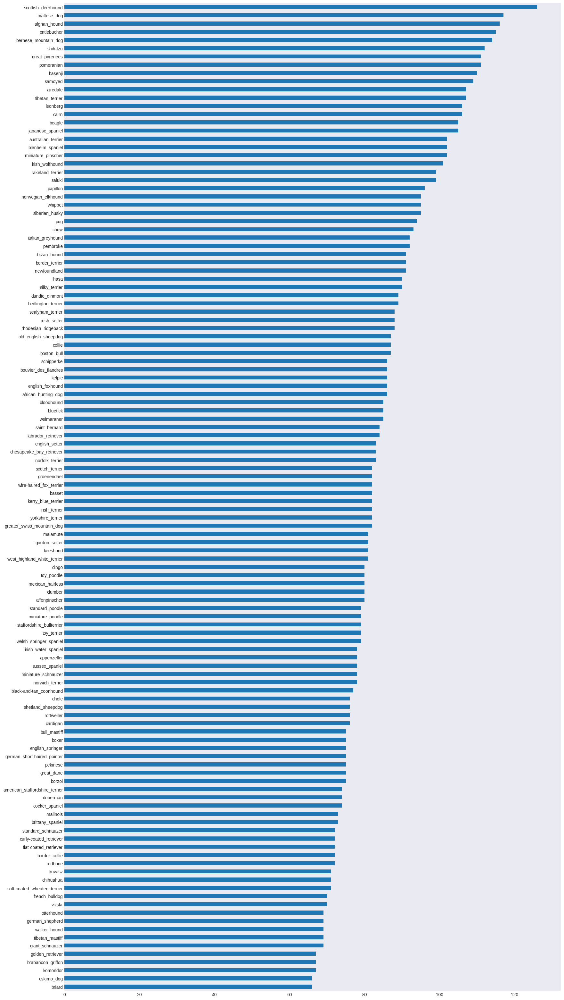

In [ ]:
labels_data["breed"].value_counts().plot.barh(figsize=(20,40)).invert_yaxis();

In [ ]:
labels_data["breed"].value_counts().median()

82.0

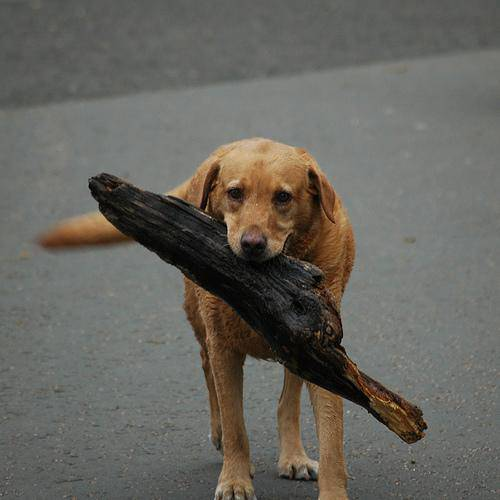

In [ ]:
from IPython.display import Image

Image("/content/drive/MyDrive/dog-indetification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

In [ ]:
image_files = ["/content/drive/MyDrive/dog-indetification/train/" + image for image in labels_data["id"] + ".jpg"]
image_files[:10]

['/content/drive/MyDrive/dog-indetification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-indetification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-indetification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-indetification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-indetification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-indetification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-indetification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-indetification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-indetification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-indetification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os

len(os.listdir("/content/drive/MyDrive/dog-indetification/train/")) == len(image_files)

True

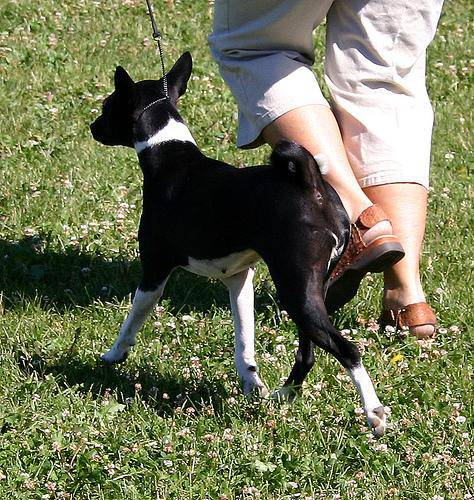

In [ ]:
Image(image_files[8])

### Turning Labels Into Numbers (Tensors)

In [ ]:
labels = labels_data["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check for missing data
len(labels) == len(image_files)

True

In [ ]:
unique_labels = np.unique(labels)
len(unique_labels)

120

In [ ]:
converted_labels = [(label == unique_labels).astype(int) for label in labels]
converted_labels[:1]

[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0])]

### Creating Validation Set

In [ ]:
X = image_files
y = converted_labels

len(image_files)

10222

In [ ]:
# testing with a portion of the data

NUM_IMAGES = 1500 #@param {type: "slider", min:1000, max:10000, step:100}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=8)

len(X_train), len(X_val)

(1200, 300)

### Turning Images Into Numbers (Tensors)

Preprocessing Images:

1. Take image filepath as input
2. Use Tensorflow to read the file at filepath and save it into a variable
3. Turn image.jpg to tensors
4. Convert color channel values from 0-255 to 0-1
5. Resize image to a certain size
6. Return modified image

In [ ]:
from matplotlib.pyplot import imread

sample_image = imread(image_files[0])
sample_image.shape

(375, 500, 3)

In [ ]:
sample_image #rgb values

array([[[109,  46,   0],
        [153,  91,  40],
        [180, 120,  68],
        ...,
        [176, 144,  71],
        [189, 157,  84],
        [214, 182, 109]],

       [[153,  92,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 135,  58],
        [171, 139,  62],
        [188, 156,  79]],

       [[152,  97,  56],
        [189, 136,  94],
        [164, 113,  70],
        ...,
        [200, 168,  81],
        [194, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 108],
        [212, 159, 107],
        [209, 156, 104]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 147,  90],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  74],
        [190, 138,  80],
        [192, 140,  82]]

In [ ]:
tf.constant(sample_image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[109,  46,   0],
        [153,  91,  40],
        [180, 120,  68],
        ...,
        [176, 144,  71],
        [189, 157,  84],
        [214, 182, 109]],

       [[153,  92,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 135,  58],
        [171, 139,  62],
        [188, 156,  79]],

       [[152,  97,  56],
        [189, 136,  94],
        [164, 113,  70],
        ...,
        [200, 168,  81],
        [194, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 108],
        [212, 159, 107],
        [209, 156, 104]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 147,  90],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

In [ ]:
IMG_SIZE = 224

def parse_image(filename):
  """
  Reads a image filename and converts image into a tensor and resizes its shape
  """

  # Read image file and store it
  image = tf.io.read_file(filename)

  # Convert image into tensor as 3 color channels RGB
  image = tf.io.decode_jpeg(image, channels=3)

  # Normalizing - Convert the color channel values to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize image
  image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])

  return image

### Turning Data into Batches

We batch process images becausse, GPU's have their limits and we can't process 10,000+ images in one go because they might not all fit into memory

That's why we batch process 32 images at a time.

In [ ]:
def get_tuple(image_path, label):
  return parse_image(image_path), label

In [ ]:
def make_batches(X, y=None, batch_size=32, validation=False, test=False):
  """
  Takes X and y data and converts data into batches
  whether its for validation, training or test
  """

  if test:
    print("Making test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    batches = data.map(parse_image).batch(batch_size)
    print("Done!")
    return batches

  elif validation:
    print("Making validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    batches = data.map(get_tuple).batch(batch_size)
    print("Done!")
    return batches

  else:
    print("Making training batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    batches = data.map(get_tuple).batch(batch_size)
    print("Done!")
    return batches


In [ ]:
training_data = make_batches(X_train, y_train)
validation_data = make_batches(X_val, y_val, validation=True)

Making training batches...
Done!
Making validation batches...
Done!


In [ ]:
training_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))

In [ ]:
validation_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))

In [ ]:
# viewing data

def view_batch(images, labels):
  plt.figure(figsize=(15,15))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])

    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")

In [ ]:
# unbatch

training_images, training_labels = next(training_data.as_numpy_iterator())

len(training_images), len(training_labels)

(32, 32)

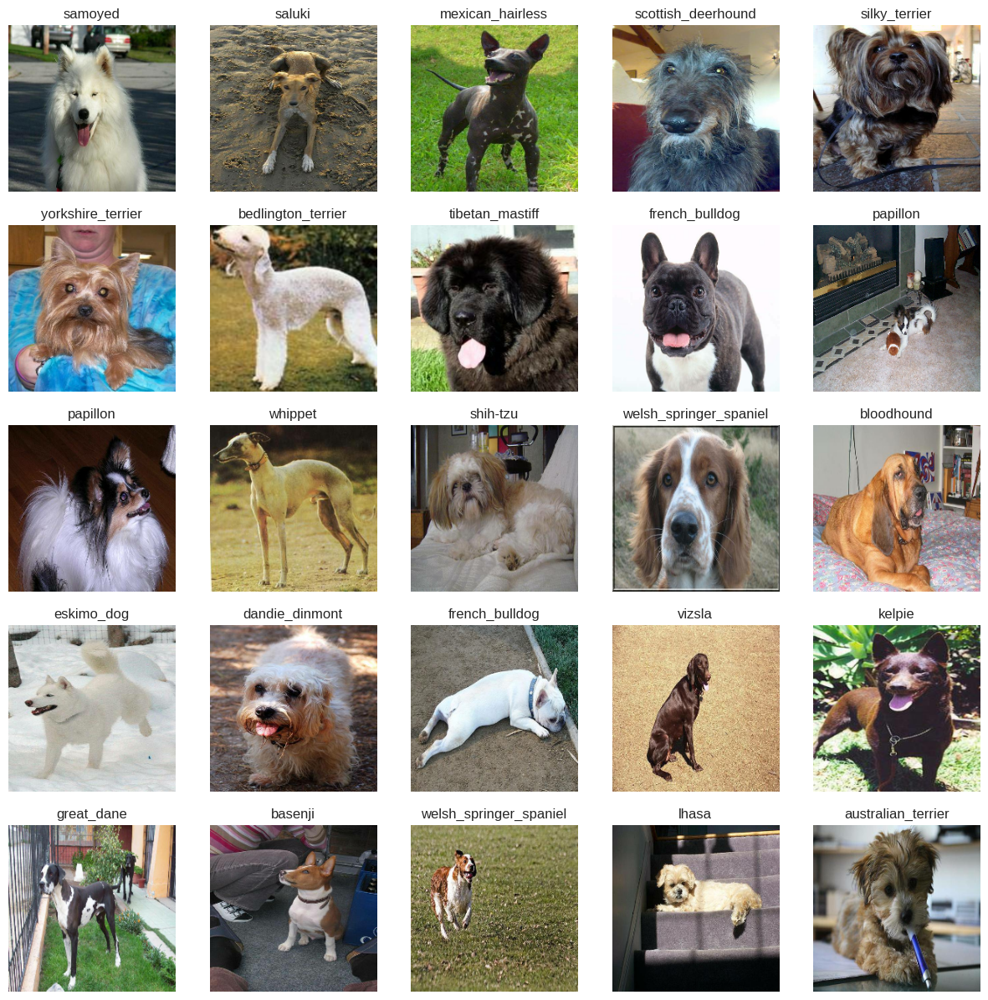

In [ ]:
view_batch(training_images, training_labels)

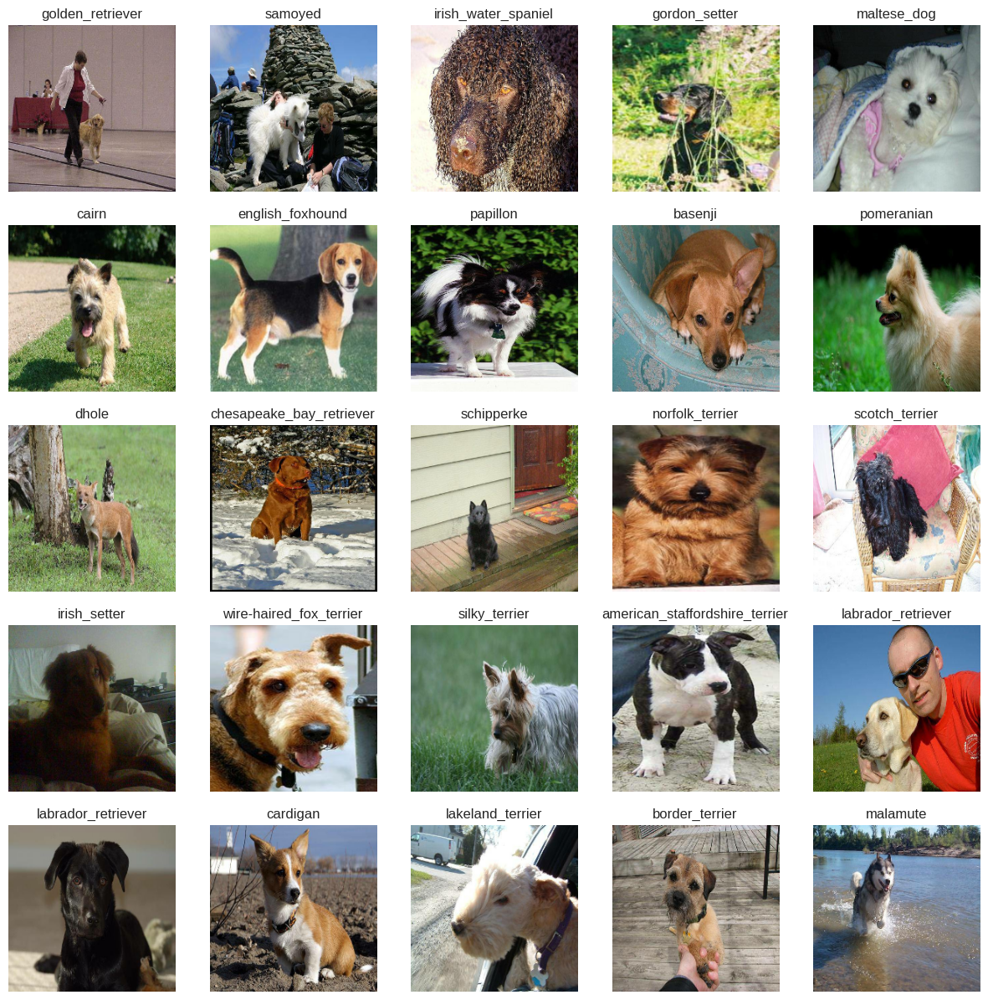

In [ ]:
val_images, val_labels = next(validation_data.as_numpy_iterator())

view_batch(val_images, val_labels)

## Modelling (Transfer Learning)

Define:
* Input shape
* Output shape
* URL of the model to use

Open Source Deep learning Code:
* https://tfhub.dev/
* https://pytorch.org/hub/
* https://modelzoo.co/
* https://paperswithcode.com/

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_labels)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5"

Keras Sequential Model:

* `tf.keras.Model.fit`: Trains the model for a fixed number of epochs.
* `tf.keras.Model.predict`: Generates output predictions for the input samples.
* `tf.keras.Model.evaluate`: Returns the loss and metrics values for the model; configured via the `tf.keras.Model.compile` method.

In [ ]:
def build_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):

  print("Building Model...")

  # Setup Model Layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Input Layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Output Layer
  ])

  # Compile model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build Model
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model = build_model()
model.summary()

Building Model...
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5508713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,628,953
Trainable params: 120,240
Non-trainable params: 5,508,713
_________________________________________________________________


### Callback Helper Functions

Callbacks:
* TensorBoard - helps track model progress like a dashboard
* Early Stopping - prevents model for training for too long and overfitting

In [ ]:
# load tensorboard
%load_ext tensorboard

In [ ]:
import datetime

def tensorboard_callback():
  # log directory for storing TensorBoard logs

  logdir = os.path.join("/content/drive/MyDrive/dog-indetification/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
earlyStopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Model Training

Test model training with only 1000 images before training on all 10,000 images

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider", min:10, max:101}

In [ ]:
def train_model():
  """
  Trains given model and returns the trained version
  """

  model = build_model()

  tensorBoard = tensorboard_callback()

  model.fit(x=training_data,
            epochs=NUM_EPOCHS,
            validation_data=validation_data,
            validation_freq=1,
            callbacks=[tensorBoard, earlyStopping])

  return model

In [ ]:
model = train_model()

Building Model...
Epoch 1/100
38/38 [==============================] - 129s 2s/step - loss: 4.1308 - accuracy: 0.1725 - val_loss: 2.6556 - val_accuracy: 0.4433
Epoch 2/100
38/38 [==============================] - 2s 64ms/step - loss: 1.2058 - accuracy: 0.7742 - val_loss: 1.5678 - val_accuracy: 0.6500
Epoch 3/100
38/38 [==============================] - 3s 68ms/step - loss: 0.4086 - accuracy: 0.9542 - val_loss: 1.2633 - val_accuracy: 0.7033
Epoch 4/100
38/38 [==============================] - 3s 76ms/step - loss: 0.1999 - accuracy: 0.9908 - val_loss: 1.1547 - val_accuracy: 0.7333
Epoch 5/100
38/38 [==============================] - 3s 67ms/step - loss: 0.1219 - accuracy: 0.9983 - val_loss: 1.0994 - val_accuracy: 0.7433
Epoch 6/100
38/38 [==============================] - 2s 63ms/step - loss: 0.0857 - accuracy: 1.0000 - val_loss: 1.0644 - val_accuracy: 0.7367
Epoch 7/100
38/38 [==============================] - 2s 62ms/step - loss: 0.0641 - accuracy: 1.0000 - val_loss: 1.0380 - val_accur

Our model is overfitting because it looks like it is doing a lot better (100% accuracy) on the training data set than the validation data set (74% accuracy)

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog-indetification/logs

<IPython.core.display.Javascript object>

## Predicting & Evaluating

In [ ]:
validation_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
predictions = model.predict(validation_data, verbose=1)
predictions

10/10 [==============================] - 1s 57ms/step


array([[1.6677703e-04, 1.4260442e-03, 2.5073961e-05, ..., 2.0640498e-04,
        1.2290525e-03, 1.0892084e-03],
       [9.1574836e-04, 3.6801379e-05, 2.8712018e-05, ..., 1.0185325e-04,
        1.6596146e-05, 2.7233700e-04],
       [3.1555777e-05, 5.9185340e-04, 5.7355122e-05, ..., 1.6678516e-05,
        5.8074169e-05, 2.4832721e-05],
       ...,
       [1.4532595e-04, 2.5395642e-04, 1.1363138e-03, ..., 3.1239012e-01,
        4.5945242e-04, 8.3032755e-05],
       [4.5367892e-04, 5.0088466e-04, 2.3245024e-04, ..., 1.0815039e-05,
        1.8582694e-05, 6.4719468e-05],
       [8.9633727e-04, 3.8496318e-04, 1.5051715e-04, ..., 1.2022312e-04,
        2.8919736e-03, 8.8145975e-03]], dtype=float32)

In [ ]:
predictions.shape

(300, 120)

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
# Exploring Predictions
index = 8

print(f"Prediction Array: {predictions[index]}")
print(f"Max Prediction Probability: {np.max(predictions[index])}")
print(f"Sum Prediction Probability: {np.sum(predictions[index])}")
print(f"Max Prediction Index: {np.argmax(predictions[index])}")
print(f"Max Prediction Label: {unique_labels[np.argmax(predictions[index])]}")

Prediction Array: [2.2944734e-05 3.1163290e-05 1.0612569e-05 4.7252647e-06 5.4278322e-03
 2.3114972e-03 1.6477262e-03 4.3005058e-01 1.4343694e-03 1.1281904e-03
 8.4480480e-06 5.8780715e-05 1.8915838e-04 6.0577422e-05 8.1658611e-05
 1.6780444e-04 1.1844658e-03 3.8397433e-05 4.2870906e-05 2.0408805e-03
 1.5573454e-05 1.1091027e-03 7.3180156e-05 1.8030270e-05 4.0911154e-06
 2.2170201e-04 2.5741794e-04 1.6187722e-03 1.3007312e-04 2.1321619e-01
 2.3383660e-04 2.2660255e-05 5.6664609e-05 1.9706393e-05 1.1821073e-04
 3.1466741e-04 2.5683694e-04 9.0014171e-03 3.6272942e-04 2.1160655e-03
 2.8480175e-05 2.3761009e-04 1.4074423e-03 2.8628026e-04 2.3006964e-03
 3.1754017e-04 4.8627815e-05 2.1621444e-04 6.3419298e-05 8.4465381e-04
 3.4403187e-05 7.4074989e-05 4.1373947e-04 3.4069849e-04 1.1310340e-04
 9.9330815e-04 1.1052867e-04 2.2406683e-04 2.4089028e-05 4.1750354e-05
 1.2816428e-02 1.6583902e-04 2.9622030e-04 2.1644130e-03 7.8637522e-06
 2.6819638e-05 3.8290837e-05 9.6450532e-03 2.6304612e-04 4.

In [ ]:
def get_prediction_label(prediction_array):
  """
  Converting predictions into labels
  """
  return unique_labels[np.argmax(prediction_array)]

In [ ]:
def unbatch(data):
  """
  Unbatching predictions
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])

  return images, labels

In [ ]:
val_images, val_labels = unbatch(validation_data)
val_images[0], val_labels[0]

(array([[[0.47418454, 0.39575318, 0.39967474],
         [0.45062193, 0.37219054, 0.3761121 ],
         [0.5071318 , 0.42870042, 0.432622  ],
         ...,
         [0.511323  , 0.43289164, 0.42897007],
         [0.5163862 , 0.44366223, 0.45210063],
         [0.4237042 , 0.36095908, 0.37272382]],
 
        [[0.42798185, 0.34955046, 0.35347202],
         [0.4929233 , 0.41449192, 0.4184135 ],
         [0.44600672, 0.36757532, 0.3714969 ],
         ...,
         [0.5495482 , 0.4711169 , 0.46719533],
         [0.4919223 , 0.41923544, 0.42640242],
         [0.39924693, 0.3365018 , 0.34040657]],
 
        [[0.4011859 , 0.3227545 , 0.32667607],
         [0.4339634 , 0.355532  , 0.35945356],
         [0.41338712, 0.33495572, 0.3388773 ],
         ...,
         [0.54033035, 0.46189898, 0.4579774 ],
         [0.5305196 , 0.46152982, 0.45574725],
         [0.4396805 , 0.37796718, 0.3756322 ]],
 
        ...,
 
        [[0.46276927, 0.40394574, 0.4235536 ],
         [0.45749488, 0.39867136, 0.41827

In [ ]:
from tensorflow.python.framework.ops import prepend_name_scope
def plot_predictions(prediction_probabilities, labels, images, n=1):
  """
  Plots images with their prediction probabilities and labels
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_prediction_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  plt.title(f"Confidence Level: {np.max(pred_prob)*100:.2f}% \nPrediction: {pred_label} \nTrue Label: {true_label}",
             color=("green" if pred_label == true_label else "red"))

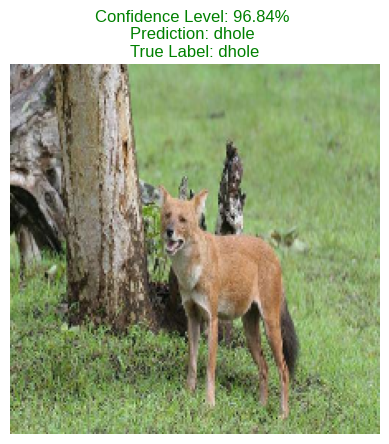

In [ ]:
plot_predictions(predictions, val_labels, val_images, n=10)

In [ ]:
def plot_predictions_conf(prediction_probabilities, labels, n=1):
  """
  Plots top 10 highest prediction confidence levels
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_prediction_label(pred_prob)

  top_10_pred_i = pred_prob.argsort()[-10:][::-1]
  top_10_conf = pred_prob[top_10_pred_i]
  top_10_pred_label = unique_labels[top_10_pred_i]

  top = plt.bar(np.arange(len(top_10_pred_i)), top_10_conf, color="grey")

  plt.xticks(np.arange(len(top_10_pred_label)), labels=top_10_pred_label, rotation="vertical")

  plt.ylim([0, 1])
  if np.isin(true_label, top_10_pred_label):
    top[np.argmax(top_10_pred_label == true_label)].set_color("green")
  else:
    top[np.argmax(top_10_pred_label == true_label)].set_color("red")
    top[np.argmax(top_10_pred_label)].set_color("green")

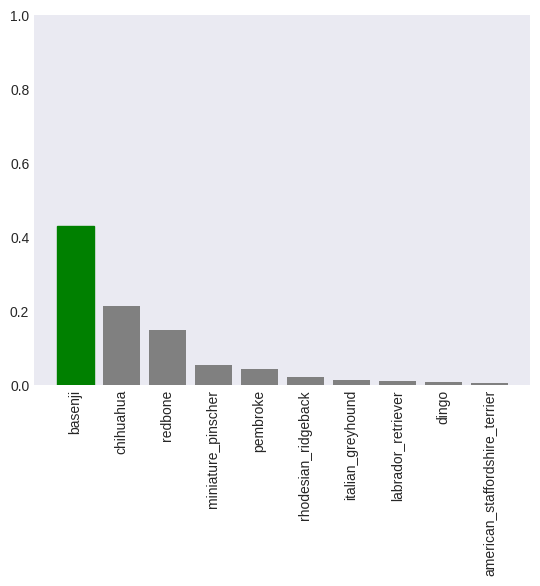

In [ ]:
plot_predictions_conf(predictions, val_labels, 8)

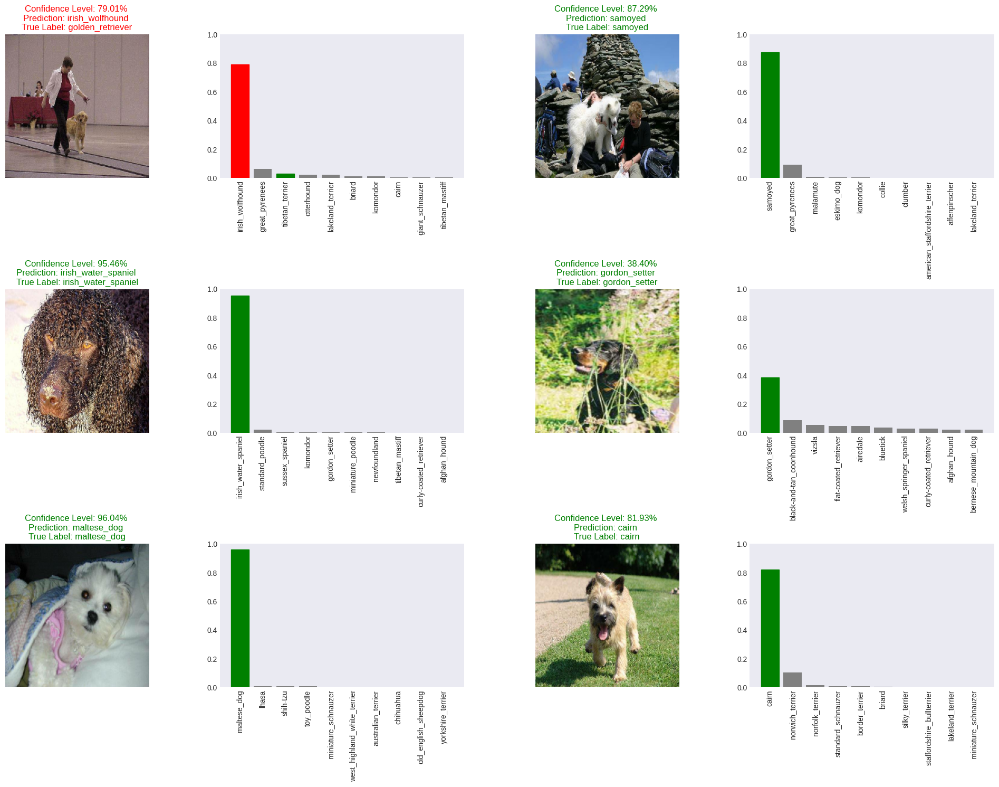

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2

num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_predictions(predictions, val_labels, val_images, n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_predictions_conf(predictions, val_labels, i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Loading a Model

In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/dog-indetification/models", datetime.datetime.now().strftime("%Y-%m-%d|%H:%M:%S"))

  model_path = modeldir + "-" + suffix + ".h5"

  print(f"Saving model to: {model_path}...")

  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  print("Done!")
  return model

In [ ]:
save_model(model, suffix="1000-img-mobilenetv3-Adam")

Saving model to: /content/drive/MyDrive/dog-indetification/models/2023-07-04|16:53:46-1000-img-mobilenetv3-Adam.h5...


'/content/drive/MyDrive/dog-indetification/models/2023-07-04|16:53:46-1000-img-mobilenetv3-Adam.h5'

In [ ]:
loaded_model = load_model("/content/drive/MyDrive/dog-indetification/models/2023-07-04|16:53:46-1000-img-mobilenetv3-Adam.h5")

Loading saved model from: /content/drive/MyDrive/dog-indetification/models/2023-07-04|16:53:46-1000-img-mobilenetv3-Adam.h5...


In [ ]:
model.evaluate(validation_data)

10/10 [==============================] - 1s 58ms/step - loss: 1.0264 - accuracy: 0.7367


[1.0264424085617065, 0.7366666793823242]

In [ ]:
loaded_model.evaluate(validation_data)

10/10 [==============================] - 22s 1s/step - loss: 1.0264 - accuracy: 0.7367


[1.0264424085617065, 0.7366666793823242]

## 🚀 Training Model On Full Data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = make_batches(X, y)

Making training batches...
Done!


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
final_model = build_model()

Building Model...


In [ ]:
final_model_tb = tensorboard_callback()
final_model_es = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note**: The following code can take a long time or at least some time to load, due to thousands of images being loaded into memory of the GPU

In [ ]:
final_model.fit(x=full_data,
                epochs=NUM_EPOCHS,
                callbacks=[final_model_tb, final_model_es])

Epoch 1/100
320/320 [==============================] - 558s 2s/step - loss: 1.3786 - accuracy: 0.6689
Epoch 2/100
320/320 [==============================] - 17s 54ms/step - loss: 0.3964 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 16s 51ms/step - loss: 0.2234 - accuracy: 0.9420
Epoch 4/100
320/320 [==============================] - 16s 51ms/step - loss: 0.1412 - accuracy: 0.9695
Epoch 5/100
320/320 [==============================] - 16s 50ms/step - loss: 0.0955 - accuracy: 0.9827
Epoch 6/100
320/320 [==============================] - 16s 51ms/step - loss: 0.0682 - accuracy: 0.9907
Epoch 7/100
320/320 [==============================] - 16s 51ms/step - loss: 0.0509 - accuracy: 0.9941
Epoch 8/100
320/320 [==============================] - 16s 50ms/step - loss: 0.0403 - accuracy: 0.9963
Epoch 9/100
320/320 [==============================] - 16s 51ms/step - loss: 0.0328 - accuracy: 0.9971
Epoch 10/100
320/320 [==============================] - 17s 52ms/step - lo

In [ ]:
save_model(final_model, "full-data-img-mobilenetv3-Adam")

Saving model to: /content/drive/MyDrive/dog-indetification/models/2023-07-04|22:46:15-full-data-img-mobilenetv3-Adam.h5...


'/content/drive/MyDrive/dog-indetification/models/2023-07-04|22:46:15-full-data-img-mobilenetv3-Adam.h5'

In [ ]:
loaded_final_model = load_model("/content/drive/MyDrive/dog-indetification/models/2023-07-04|22:46:15-full-data-img-mobilenetv3-Adam.h5")

Loading saved model from: /content/drive/MyDrive/dog-indetification/models/2023-07-04|22:46:15-full-data-img-mobilenetv3-Adam.h5...


## 📈 Predicting From Test Data

In [ ]:
test_path = "/content/drive/MyDrive/dog-indetification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog-indetification/test/e43f6e621469f438f351d31d889b839f.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e4ec1e1a3e21d31f6e058c04655cb38b.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e2537e98808877c707bfe8ca53e303b7.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e67cd079a0f9c15ebee3c41743906c73.jpg',
 '/content/drive/MyDrive/dog-indetification/test/de15c21ba0a1f139d26223d5e2b09703.jpg',
 '/content/drive/MyDrive/dog-indetification/test/de90fcd52b9c527ea097d88804985516.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e15513ca7ebb4730731f34c25e906502.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e47bc25097050ba689b64de02c725837.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e4b76574d24800b91bdcfc886fb74f23.jpg',
 '/content/drive/MyDrive/dog-indetification/test/e12e6997c15c233c7b92209e08ff9d14.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = make_batches(test_filenames, test=True)

Making test batches...
Done!


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_final_model.predict(test_data, verbose=1)

324/324 [==============================] - 723s 2s/step


In [ ]:
np.savetxt("/content/drive/MyDrive/dog-indetification/predictions.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/dog-indetification/predictions.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
test_predictions[:10]

array([[2.77006178e-11, 4.66964778e-09, 1.77784523e-10, ...,
        9.23055122e-12, 1.14417897e-08, 5.47635993e-13],
       [1.79585906e-13, 1.97425670e-11, 3.67673045e-11, ...,
        1.04868045e-10, 3.50559165e-11, 9.28085733e-11],
       [1.05902648e-11, 5.29650108e-13, 3.73003142e-13, ...,
        4.24394813e-14, 2.91125934e-12, 5.26821468e-11],
       ...,
       [9.72606244e-07, 2.58793231e-09, 8.89034002e-09, ...,
        3.71433884e-09, 2.78891130e-05, 7.04352760e-06],
       [7.19110915e-07, 2.06245682e-06, 3.30030642e-10, ...,
        9.36762135e-09, 1.33293714e-08, 4.41947723e-09],
       [4.12390015e-08, 9.31873068e-09, 8.67273570e-07, ...,
        3.66719738e-10, 1.97485156e-06, 1.68282022e-05]])

## Organizing Outputs

In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:3]

['e43f6e621469f438f351d31d889b839f',
 'e4ec1e1a3e21d31f6e058c04655cb38b',
 'e2537e98808877c707bfe8ca53e303b7']

In [ ]:
predictions_df = pd.DataFrame(columns=["id"] + list(unique_labels))
predictions_df["id"] = test_ids
predictions_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e43f6e621469f438f351d31d889b839f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4ec1e1a3e21d31f6e058c04655cb38b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2537e98808877c707bfe8ca53e303b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e67cd079a0f9c15ebee3c41743906c73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,de15c21ba0a1f139d26223d5e2b09703,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
predictions_df[list(unique_labels)] = test_predictions
predictions_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e43f6e621469f438f351d31d889b839f,2.770062e-11,4.669648e-09,1.777845e-10,6.571980e-10,3.060390e-10,6.738666e-11,1.594386e-10,3.282122e-11,9.999963e-01,...,2.715096e-11,2.423947e-11,3.845096e-10,1.594678e-06,9.418520e-11,6.836679e-08,8.228595e-10,9.230551e-12,1.144179e-08,5.476360e-13
1,e4ec1e1a3e21d31f6e058c04655cb38b,1.795859e-13,1.974257e-11,3.676730e-11,5.872867e-11,1.065709e-09,7.136714e-12,1.714935e-10,7.752121e-12,1.358685e-11,...,6.258208e-11,3.672196e-11,5.953952e-10,2.733234e-09,5.365266e-11,1.836324e-08,4.471021e-11,1.048680e-10,3.505592e-11,9.280857e-11
2,e2537e98808877c707bfe8ca53e303b7,1.059026e-11,5.296501e-13,3.730031e-13,2.176532e-11,1.817746e-10,1.778397e-11,1.254147e-11,1.010078e-09,1.827197e-11,...,6.918931e-11,1.166914e-13,1.211419e-13,9.445091e-10,5.896649e-13,4.712171e-13,9.512614e-11,4.243948e-14,2.911259e-12,5.268215e-11
3,e67cd079a0f9c15ebee3c41743906c73,3.032116e-10,3.460304e-06,6.769215e-12,6.915012e-11,1.806556e-08,8.728657e-09,4.960176e-09,1.248492e-09,7.899319e-10,...,4.281848e-07,7.098452e-11,2.588719e-09,4.275562e-10,2.051238e-10,1.043997e-11,4.885785e-06,6.698214e-09,9.633928e-07,8.871458e-09
4,de15c21ba0a1f139d26223d5e2b09703,6.693242e-14,2.169668e-11,3.676449e-13,9.458809e-10,6.367006e-11,4.068084e-13,3.727140e-11,2.382411e-13,2.648269e-13,...,1.187559e-10,1.157770e-10,2.645564e-09,1.023889e-13,9.999996e-01,5.761896e-14,4.899936e-14,9.341526e-12,1.226101e-12,2.235305e-12


In [ ]:
predictions_df.to_csv("/content/drive/MyDrive/dog-indetification/full-model-predictions.csv", index=False)

## Making Predictions On Custom Images

In [ ]:
custom_path = "/content/drive/MyDrive/dog-indetification/my-dog-photos/"
custom_images_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_images_path

['/content/drive/MyDrive/dog-indetification/my-dog-photos/dog-img-3.jpg',
 '/content/drive/MyDrive/dog-indetification/my-dog-photos/dog-img-2.jpg',
 '/content/drive/MyDrive/dog-indetification/my-dog-photos/dog-img-1.jpg']

In [ ]:
custom_data = make_batches(custom_images_path, test=True)
custom_data

Making test batches...
Done!


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_predictions = loaded_final_model.predict(custom_data)

1/1 [==============================] - 8s 8s/step


In [ ]:
custom_predictions.shape

(3, 120)

In [ ]:
custom_predictions_labels = [get_prediction_label(custom_predictions[i]) for i in range(len(custom_predictions))]
custom_predictions_labels

['pomeranian', 'pomeranian', 'chow']

In [ ]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

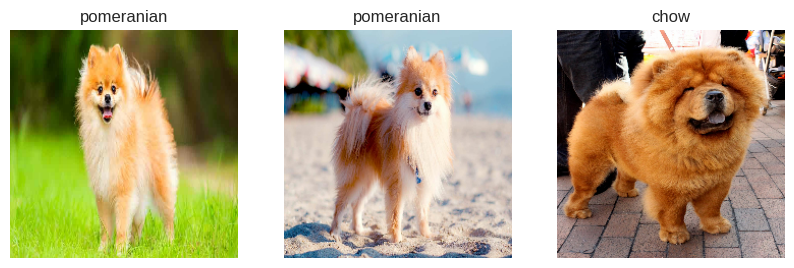

In [ ]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_predictions_labels[i])
  plt.imshow(image)

# 🐶 Final Dog Vision

Run the following cells to test out the model on various custom dog images from your google drive.

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
import tensorboard as tb
import os

plt.style.use("seaborn-v0_8-dark")

print("Tensorflow Version: " + tf.__version__)
print("Tensorflow Hub Version: " + hub.__version__)

Tensorflow Version: 2.12.0
Tensorflow Hub Version: 0.13.0


In [2]:
print("GPU is available" if tf.config.list_physical_devices("GPU") else "GPU Not Available")

GPU is available


In [3]:
# Data is from the Dog Identification Competition on kaggle, link to the data is at the top of this notebook
labels_data = pd.read_csv("/content/drive/MyDrive/dog-indetification/labels.csv")
labels = labels_data["breed"].to_numpy()
unique_labels = np.unique(labels)

In [4]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  print("Done!")
  return model

In [12]:
IMG_SIZE = 224

def parse_image(filename):
  """
  Reads a image filename and converts image into a tensor and resizes its shape
  """

  # Read image file and store it
  image = tf.io.read_file(filename)

  # Convert image into tensor as 3 color channels RGB
  image = tf.io.decode_jpeg(image, channels=3)

  # Normalizing - Convert the color channel values to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize image
  image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])

  return image

In [5]:
def get_tuple(image_path, label):
  return parse_image(image_path), label

In [6]:
def make_batches(X, y=None, batch_size=32, validation=False, test=False):
  """
  Takes X and y data and converts data into batches
  whether its for validation, training or test
  """

  if test:
    print("Making test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    batches = data.map(parse_image).batch(batch_size)
    print("Done!")
    return batches

  elif validation:
    print("Making validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    batches = data.map(get_tuple).batch(batch_size)
    print("Done!")
    return batches

  else:
    print("Making training batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    batches = data.map(get_tuple).batch(batch_size)
    print("Done!")
    return batches


In [7]:
def get_prediction_label(prediction_array):
  """
  Converting predictions into labels
  """
  return unique_labels[np.argmax(prediction_array)]

In [8]:
def predict_dog_breed(imgs_folder_path, model_path):
  """
  Predicts the dog breed of a or multiple custom images that are stored in a given file path
  imgs_folder_path - The path of the folder where images are stored
  model_path - The path of where the model is stored
  """

  loaded_model = load_model(model_path)

  custom_images_path = [imgs_folder_path + fname for fname in os.listdir(imgs_folder_path)]

  custom_data = make_batches(custom_images_path, test=True)

  custom_predictions = loaded_model.predict(custom_data)

  custom_predictions_labels = [get_prediction_label(custom_predictions[i]) for i in range(len(custom_predictions))]

  custom_images = []

  for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

  plt.figure(figsize=(10,10))
  for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_predictions_labels[i])
    plt.imshow(image)

Loading saved model from: /content/drive/MyDrive/dog-indetification/models/2023-07-04|22:46:15-full-data-img-mobilenetv3-Adam.h5...
Done!
Making test batches...
Done!
1/1 [==============================] - 11s 11s/step


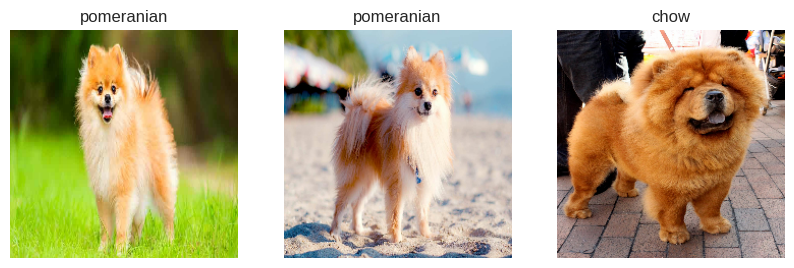

In [13]:
IMG_PATH = "/content/drive/MyDrive/dog-indetification/my-dog-photos/"
MODEL_PATH = "/content/drive/MyDrive/dog-indetification/models/2023-07-04|22:46:15-full-data-img-mobilenetv3-Adam.h5"
predict_dog_breed(imgs_folder_path=IMG_PATH, model_path=MODEL_PATH)